In [1]:
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage.io
from skimage import measure

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# Import path
module_path = str(Path.cwd().parents[0])
if module_path not in sys.path:
    sys.path.append(module_path)

from config import *

In [4]:
module_path = str(Path.cwd().parents[0] / "src")

if module_path not in sys.path:
    sys.path.append(module_path)
    
import utils as utils

In [5]:
csv_file = data_meta / "all_info.csv"

# Read dataframe containing images information
df = pd.read_csv(csv_file)

# Get registration result

In [48]:
from matplotlib.colors import ListedColormap


def create_transparent_cmap(cmap):
    # Get the colormap colors
    my_cmap = cmap(np.arange(cmap.N))

    # Set alpha
    my_cmap[:, -1] = np.linspace(0, 1, cmap.N)

    # Create new colormap
    my_cmap = ListedColormap(my_cmap)

    return my_cmap

def create_random_cmap():
    vals = np.linspace(0,1,256)
#     np.random.shuffle(vals)
    cmap = plt.cm.colors.ListedColormap(plt.cm.jet(vals))
    return cmap

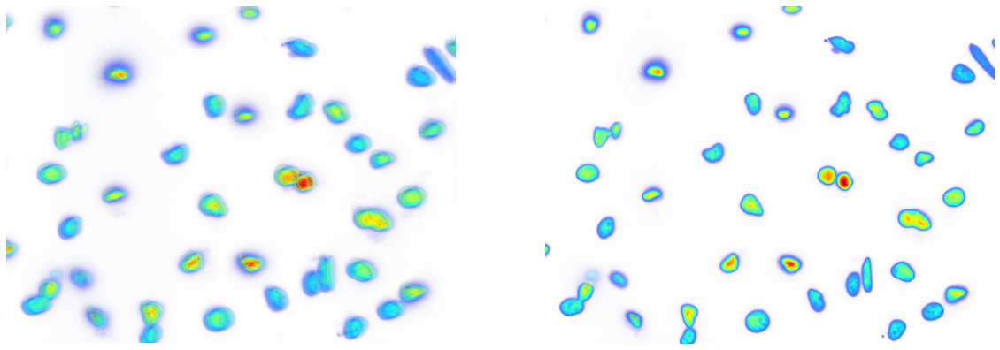

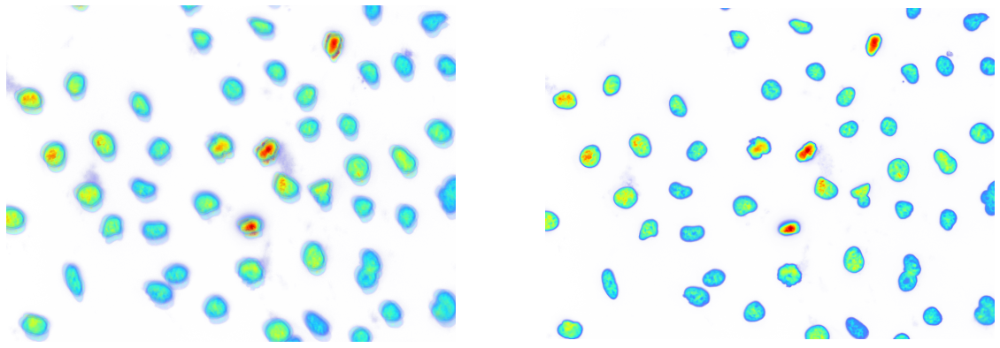

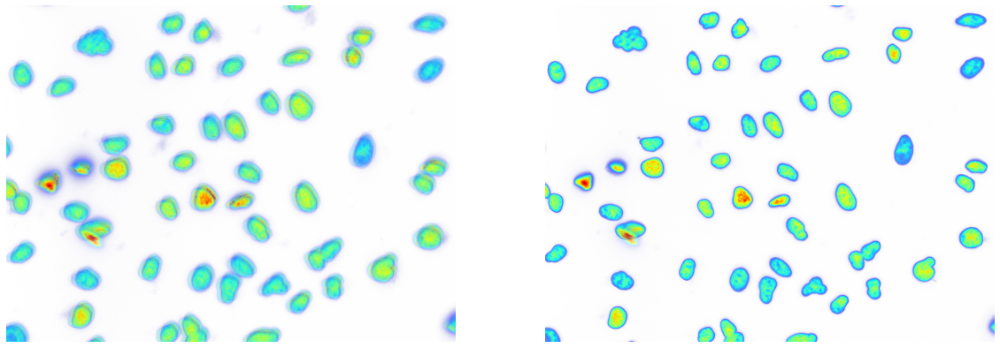

In [49]:
# Get shift between cycle
cycles = df.Cycle.unique()
conditions = df.Location.unique()

colors = [create_random_cmap() for _ in range(len(cycles))]
my_cmaps = [create_transparent_cmap(cmap) for cmap in colors]

for condition in conditions:
    df_subset = df[(df.Location == condition) & (df.Channel == "CH1")]

    fig, axs = plt.subplots(1, 2)
    for idx, cycle in enumerate(cycles):
        temp = df_subset[df_subset.Cycle == cycle]
        img_dapi = skimage.io.imread(temp[temp.Z_stack == "1"].Path.item())
        if len(img_dapi.shape) >2:
            img_dapi = img_dapi[:,:,0]
        img_dapi_corrected = skimage.io.imread(
            temp[temp.Z_stack == "1"].Path_corrected.item()
        )

        axs[0].imshow(img_dapi, cmap=my_cmaps[idx], alpha=0.8)
        axs[1].imshow(img_dapi_corrected, cmap=my_cmaps[idx], alpha=0.8)

    axs[0].axis("off")
    axs[1].axis("off")

    fig.set_size_inches(20, 40)
#     fig.savefig(str(condition)+'.png', bbox_inches='tight', dpi=100)
    plt.show()

# Mask outline with numbering

In [29]:
imgs, conditions = utils.get_composite_image(df)

In [30]:
masks = utils.get_masks(data_mask)

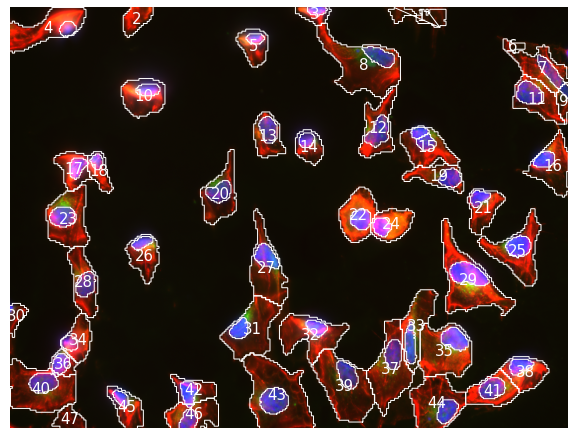

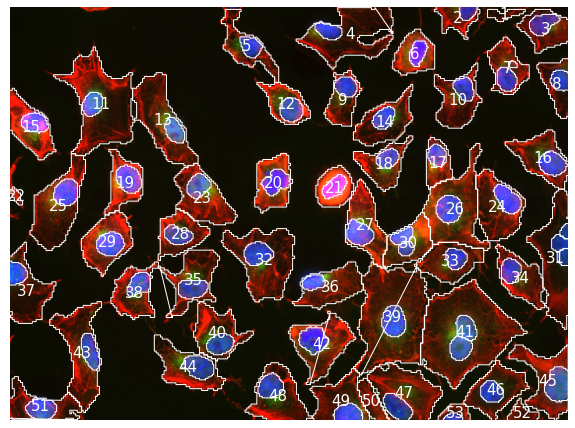

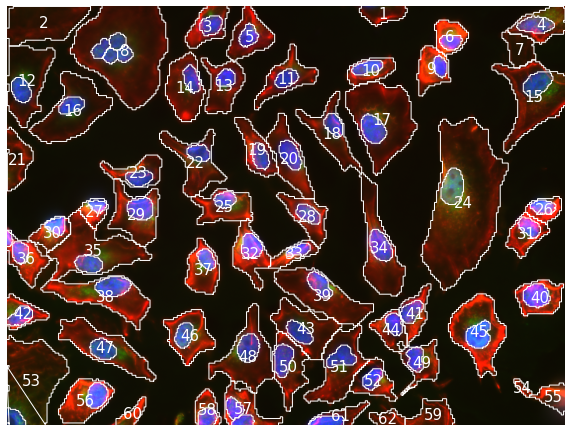

In [33]:
for idx, condition in enumerate(masks.keys()):
    mask = masks[condition]['cyto']
    mask_nuclei = masks[condition]['nuclei']

    # Get contour of masks
    contours = {}
    labels = [n for n in np.unique(mask) if n > 0]
    for i in labels:
        temp = np.where(mask == i, mask, 0)
        contours[i] = np.concatenate(measure.find_contours(temp, 0.01))
        
    # Get contour of masks
    contours_nuclei = {}
    labels = [n for n in np.unique(mask_nuclei) if n > 0]
    for i in labels:
        temp = np.where(mask_nuclei == i, mask_nuclei, 0)
        contours_nuclei[i] = np.concatenate(measure.find_contours(temp, 0.01))

    # Get centroid of mask
    props = measure.regionprops_table(mask, properties=['label', 'centroid'])
    labels = props['label']
    ys = props['centroid-0']
    xs = props['centroid-1']

    # Show contour
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(imgs[idx], cmap='Greys_r')
    ax.axis('off')

    for label, contour in contours.items():
        ax.plot(contour[:, 1], contour[:, 0], linewidth=1, c='w')
    for label, contour in contours_nuclei.items():
        ax.plot(contour[:, 1], contour[:, 0], linewidth=1, c='w')    
    for idx, (x, y) in enumerate(zip(xs, ys)):
        ax.annotate(labels[idx], (x, y), fontsize=15,
                    c='white', ha='center', va='center')
        
#     fig.savefig(str(condition)+'_outline_id.png', bbox_inches='tight', dpi=100)

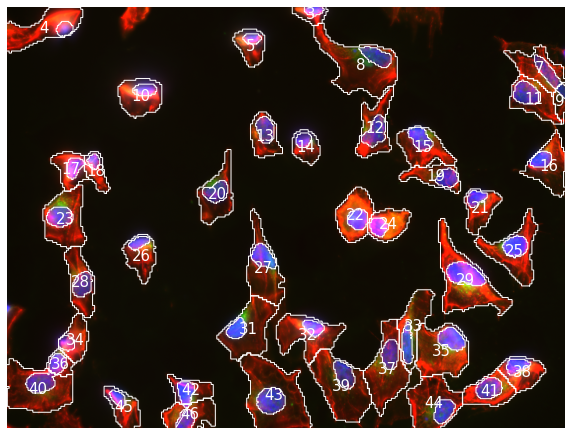

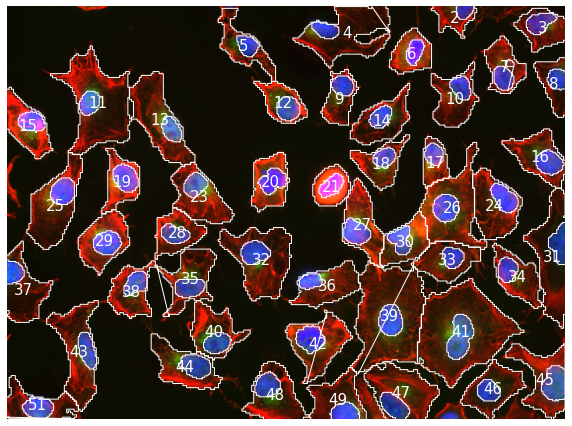

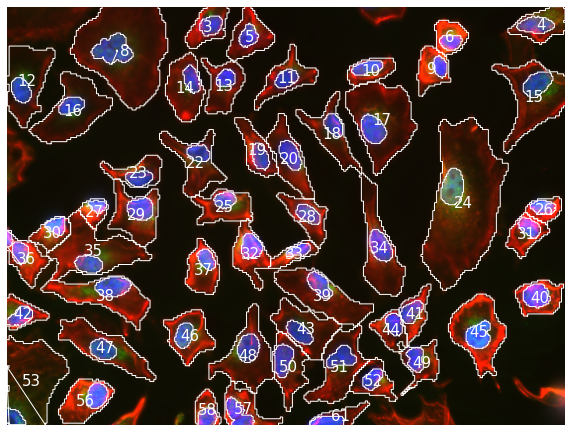

In [34]:
for idx, condition in enumerate(masks.keys()):
    mask, mask_nuclei, _ = utils.qc_nuclei(
        masks[condition]['cyto'], masks[condition]['nuclei'])

    # Get contour of masks
    contours = {}
    contours_nuclei = {}
    labels = [n for n in np.unique(mask) if n > 0]
    for i in labels:
        temp = np.where(mask == i, mask, 0)
        contours[i] = np.concatenate(measure.find_contours(temp, 0.01))
        temp = np.where(mask_nuclei == i, mask, 0)
        contours_nuclei[i] = np.concatenate(measure.find_contours(temp, 0.01))

    # Get centroid of mask
    props = measure.regionprops_table(mask, properties=['label', 'centroid'])
    labels = props['label']
    ys = props['centroid-0']
    xs = props['centroid-1']

    # Show contour
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(imgs[idx], cmap='Greys_r')
    ax.axis('off')
    for label, contour in contours.items():
        ax.plot(contour[:, 1], contour[:, 0], linewidth=1, c='w')
        ax.plot(contours_nuclei[label][:, 1],
                contours_nuclei[label][:, 0], linewidth=1, c='w')
    for idx, (x, y) in enumerate(zip(xs, ys)):
        ax.annotate(labels[idx], (x, y), fontsize=15,
                    c='white', ha='center', va='center')
        
#     fig.savefig(str(condition)+'_outline_id_qc.png', bbox_inches='tight', dpi=100)

# Mask with numbering

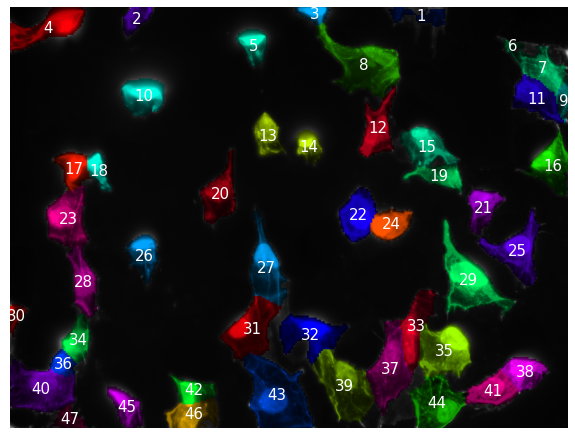

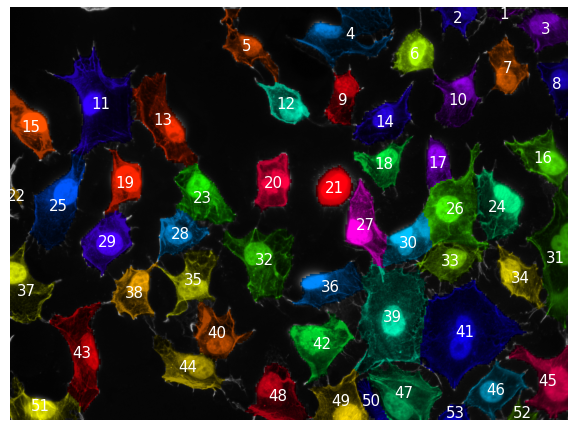

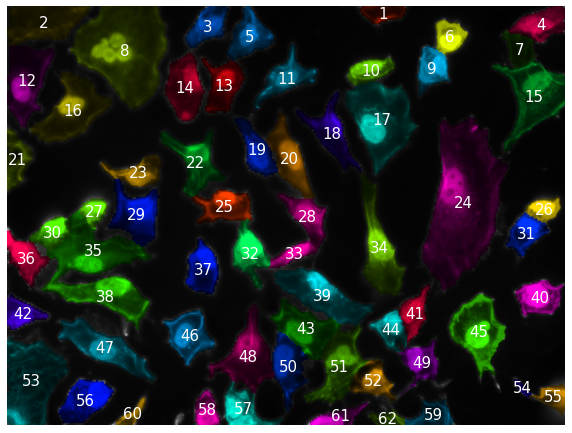

In [61]:
for idx, condition in enumerate(masks.keys()):
    mask = masks[condition]['cyto']

    # Overlay mask on image
    mask_overlay = utils.mask_overlay(imgs[idx], mask)

    # Get centroid of mask
    props = measure.regionprops_table(mask, properties=['label', 'centroid'])
    labels = props['label']
    ys = props['centroid-0']
    xs = props['centroid-1']

    # Show contour
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(mask_overlay)
    ax.axis('off')
    for idx, (x, y) in enumerate(zip(xs, ys)):
        ax.annotate(labels[idx], (x, y), fontsize=15,
                    c='white', ha='center', va='center')

#     fig.savefig(str(condition)+'_mask_id.png', bbox_inches='tight', dpi=100)

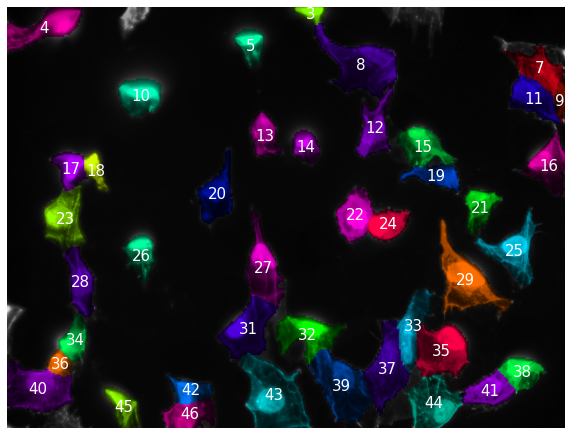

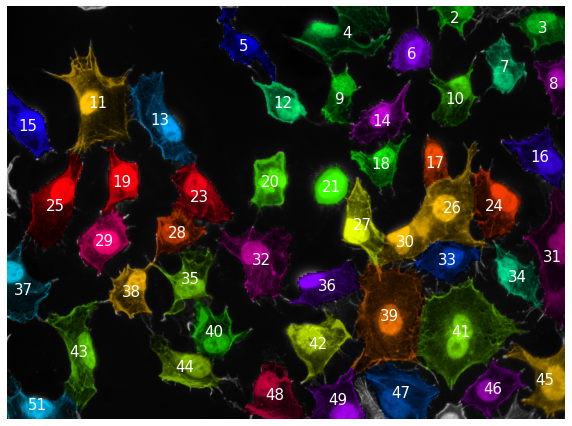

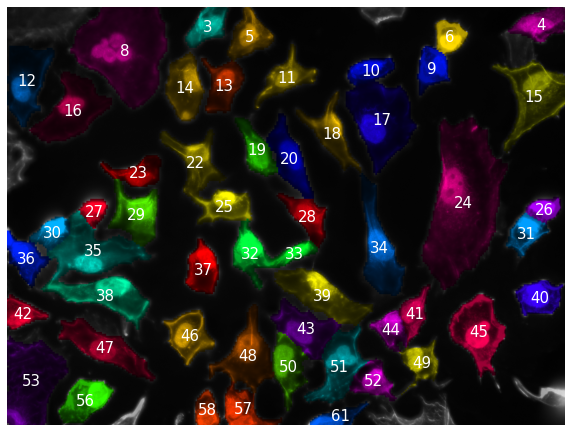

In [62]:
for idx, condition in enumerate(masks.keys()):
    cell_mask, _, _ = utils.qc_nuclei(
        masks[condition]['cyto'], masks[condition]['nuclei'])

    # Overlay mask on image
    mask_overlay = utils.mask_overlay(imgs[idx], cell_mask)

    # Get centroid of mask
    props = measure.regionprops_table(
        cell_mask, properties=['label', 'centroid'])
    labels = props['label']
    ys = props['centroid-0']
    xs = props['centroid-1']

    # Show contour
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(mask_overlay)
    ax.axis('off')
    for idx, (x, y) in enumerate(zip(xs, ys)):
        ax.annotate(labels[idx], (x, y), fontsize=15,
                    c='white', ha='center', va='center')

#     fig.savefig(str(condition)+'_mask_id_qc.png', bbox_inches='tight', dpi=100)

# Mask with overlay

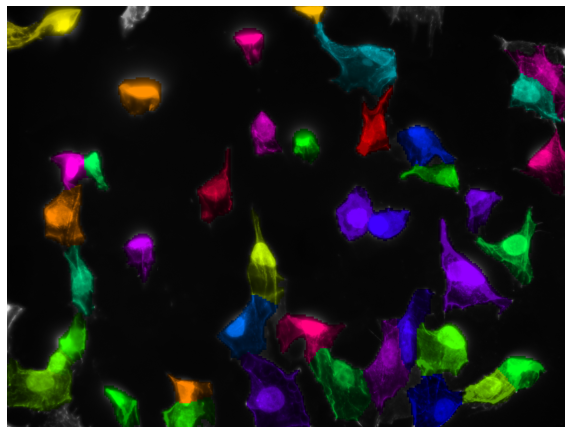

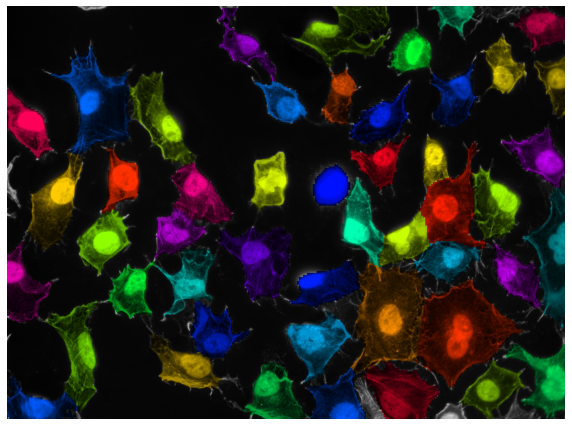

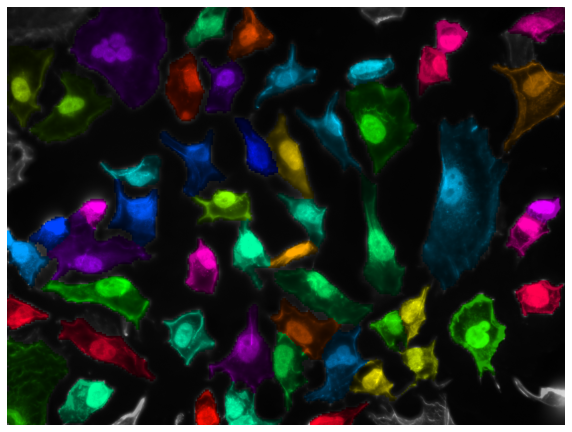

In [58]:
for idx, condition in enumerate(masks.keys()): 
    cell_mask, _, _ = utils.qc_nuclei(masks[condition]['cyto'], masks[condition]['nuclei'])

    # Overlay mask on image
    mask_overlay = utils.mask_overlay(imgs[idx], cell_mask)
    
    # Show contour
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(mask_overlay)
    ax.axis('off')
#     fig.savefig(str(condition)+'_cell_overlay.png', bbox_inches='tight', dpi=100)

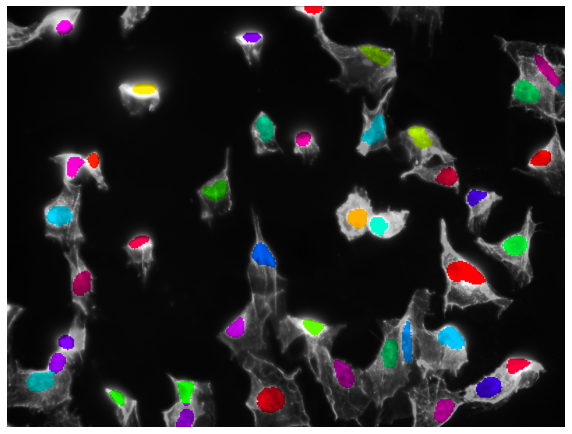

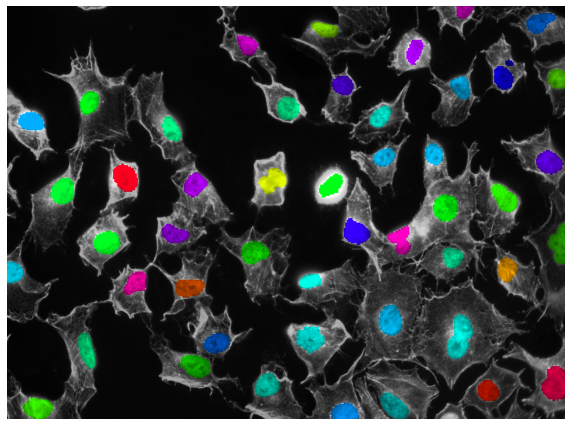

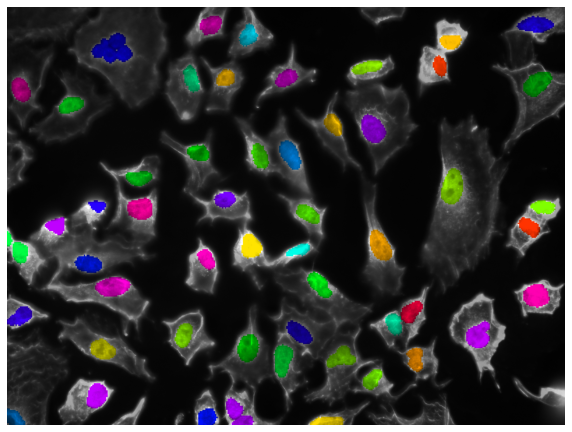

In [59]:
for idx, condition in enumerate(masks.keys()): 
    _, nuclei_mask, _ = qc_nuclei(masks[condition]['cyto'], masks[condition]['nuclei'])

    # Overlay mask on image
    mask_overlay = utils.mask_overlay(imgs[idx], nuclei_mask)
    
    # Show contour
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(mask_overlay)
    ax.axis('off')
#     fig.savefig(str(condition)+'_nuclei_overlay.png', bbox_inches='tight', dpi=100)

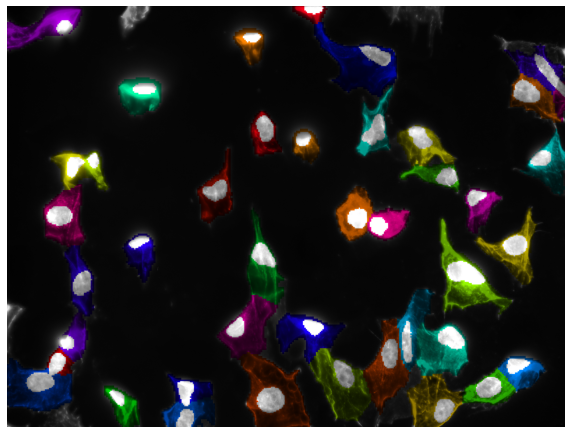

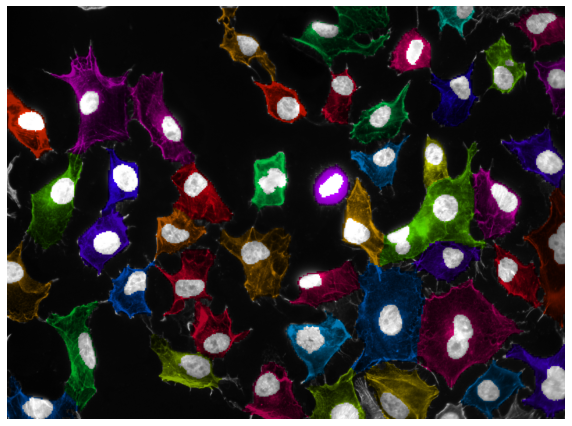

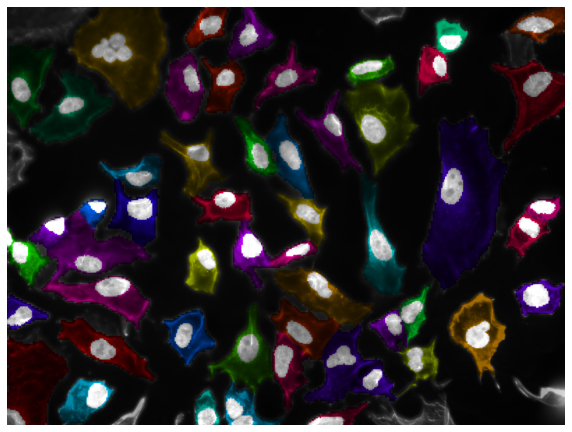

In [60]:
for idx, condition in enumerate(masks.keys()): 
    _, _, cyto_mask = qc_nuclei(masks[condition]['cyto'], masks[condition]['nuclei'])

    # Overlay mask on image
    mask_overlay = utils.mask_overlay(imgs[idx], cyto_mask)
    
    # Show contour
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(mask_overlay)
    ax.axis('off')
#     fig.savefig(str(condition)+'_cyto_overlay.png', bbox_inches='tight', dpi=100)

# Show image

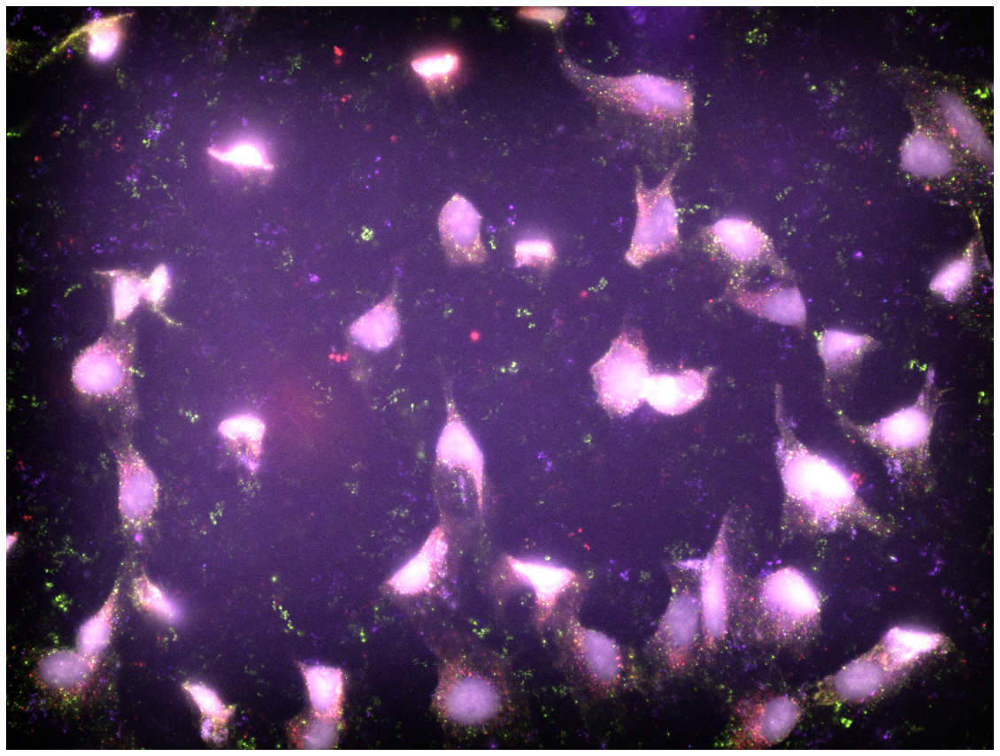

In [87]:
RGB_MAP = {
    1: {"rgb": np.array([0, 0, 255]), "range": [0, 255]},
    2: {"rgb": np.array([255, 51, 51]), "range": [0, 50]},
    3: {"rgb": np.array([255, 153, 51]), "range": [0, 50]},
    4: {"rgb": np.array([255, 255, 51]), "range": [0, 50]},
    5: {"rgb": np.array([153, 255, 51]), "range": [0, 50]},
    6: {"rgb": np.array([51, 255, 51]), "range": [0, 50]},
    7: {"rgb": np.array([51, 51, 255]), "range": [0, 50]},
    8: {"rgb": np.array([153, 51, 255]), "range": [0, 50]},
    9: {"rgb": np.array([153, 51, 255]), "range": [0, 50]},
    10: {"rgb": np.array([153, 51, 255]), "range": [0, 50]},
    11: {"rgb": np.array([153, 51, 255]), "range": [0, 50]},
    12: {"rgb": np.array([153, 51, 255]), "range": [0, 50]},
    13: {"rgb": np.array([153, 51, 255]), "range": [0, 50]},
    14: {"rgb": np.array([153, 51, 255]), "range": [0, 50]},
    15: {"rgb": np.array([153, 51, 255]), "range": [0, 50]}
}

df_subset = df[(df.Location == conditions[0]) & (df.Z_stack == "Combined")]

fig, ax = plt.subplots(1, 1, figsize=(20, 20))
data = None
for idx, cycle in enumerate(cycles[1:-1]):
    temp = df_subset[df_subset.Cycle == cycle]
    for row in temp.itertuples():
        if row.Marker != "Hoeschst":
            img = skimage.io.imread(row.Path_corrected)
            if not data is None:
                data = np.concatenate((data, img[:, :, np.newaxis]), axis=2)
            else:
                data = img[:, :, np.newaxis]
    channel = [i for i in range(1, len(data[0][0]) + 1)]
img = convert_to_rgb(data, channels=channel, rgb_map=RGB_MAP, vmax=35536)
ax.imshow(img)
ax.axis('off')
# fig.savefig('multiplex_overlay.png', bbox_inches='tight', dpi=100)
plt.show()

In [ ]:
len(channel)